# Import libraries

In [1]:
import os
import sys

# Add the root directory to Python path so that we can import the modules
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(root_dir)

In [2]:
import torch
import matplotlib.pyplot as plt
from torchgeo.transforms import AugmentationSequential
import kornia.augmentation as K
from torchgeo.datasets.utils import stack_samples
from lightning.pytorch import Trainer
from torchgeo.models import ResNet50_Weights
from torchgeo.trainers import SemanticSegmentationTask
from torch.utils.data import DataLoader
from pugs_detection.raster import create_image_tiles
from pugs_detection.modeling.model import modify_first_layer
from pugs_detection.plots import plot_image_tiles, visualize_from_torchgeo_dataloader, visualize_predictions
from pugs_detection.utils import set_all_seeds
from pugs_detection.dataset import create_dataset_split

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Set seed to make it reproducible

In [3]:
# Set seeds for reproducibility
set_all_seeds(42)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


# Create image patches (Torchgeo)

## Create image tiles for training, validation, and test set

Manually specify tile

In [4]:
# train, validation, test index list
# train_index_list = [3, 4, 6, 7, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 25]
# val_index_list = [2, 5, 9, 21, 24]
# test_index_list = [1, 8, 10, 14, 17]
train_index_list = [3, 11, 12, 13, 15, 16, 18, 19, 22]
val_index_list = [7, 17]
test_index_list = [8, 14]
output_folder_path = '../data/processed/tiles'
image_path = '../data/processed/sentinel-2/stacked_sentinel2_dresden_clipped.geotiff'

In [5]:
all_tiles_list = create_image_tiles(output_folder_path, image_path, train_index_list, val_index_list, test_index_list)

Image bounds width: 27110.0 height: 22640.0
Tile dimensions width: 5422.0 height: 4528.0
Skipping tile 1: only 0.0% valid data
Skipping tile 2: only 44.4% valid data
Tile 3 saved to train folder (85.5% valid data)
Skipping tile 4: only 7.0% valid data
Skipping tile 5: only 0.0% valid data
Skipping tile 6: only 13.3% valid data
Tile 7 saved to val folder (93.8% valid data)
Tile 8 saved to test folder (95.8% valid data)
Skipping tile 9: only 36.9% valid data
Skipping tile 10: only 0.8% valid data
Tile 11 saved to train folder (59.9% valid data)
Tile 12 saved to train folder (100.0% valid data)
Tile 13 saved to train folder (100.0% valid data)
Tile 14 saved to test folder (98.8% valid data)
Tile 15 saved to train folder (54.1% valid data)
Tile 16 saved to train folder (77.8% valid data)
Tile 17 saved to val folder (100.0% valid data)
Tile 18 saved to train folder (99.7% valid data)
Tile 19 saved to train folder (92.3% valid data)
Skipping tile 20: only 35.7% valid data
Skipping tile 21: o

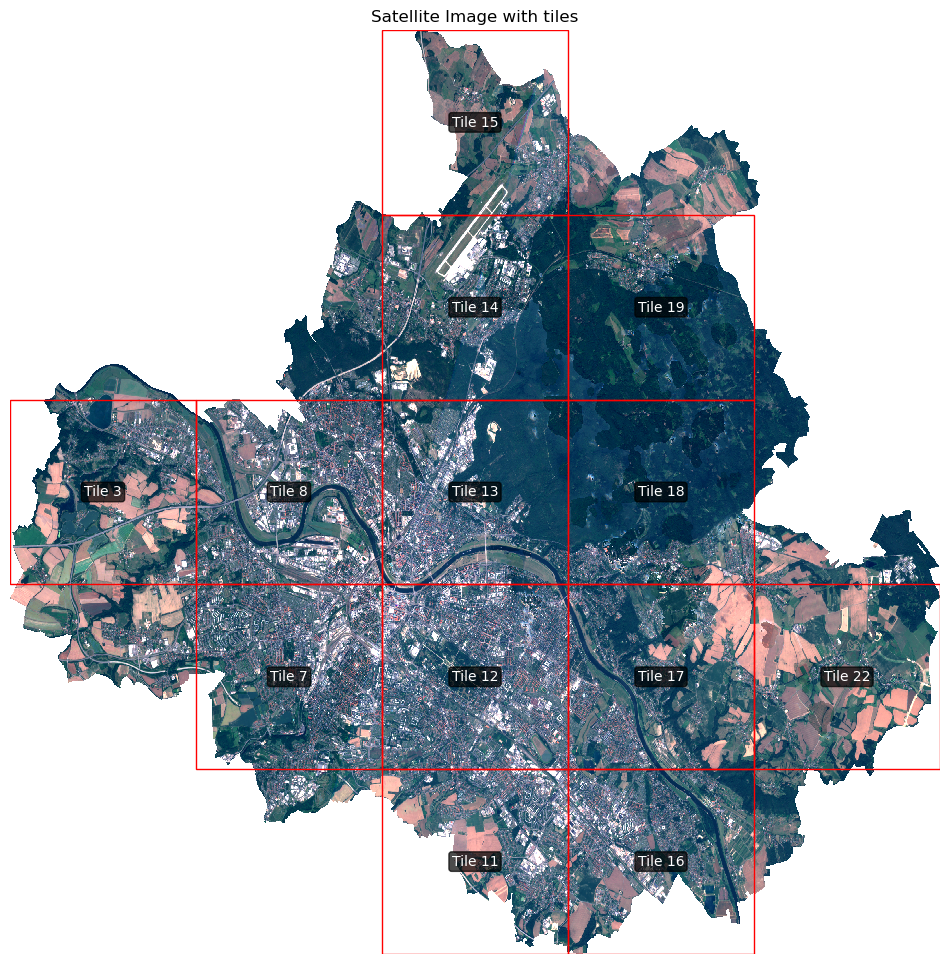

In [6]:
plot_image_tiles(image_path, all_tiles_list)

---

# Define functions for creating patches

In [7]:
import warnings

warnings.filterwarnings(
    "ignore", 
    message="You will likely lose important projection information when converting to a PROJ string from another format.*", 
    category=UserWarning
)

warnings.filterwarnings(
    "ignore",
    message="Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired.*",
    category=UserWarning
)

# Start create patches

In [9]:
# Define paths for pre-split tiles
train_image_path = '../data/processed/tiles/train'
val_image_path = '../data/processed/tiles/val'
test_image_path = '../data/processed/tiles/test'

In [10]:
# Vector data path
# label_path = '../data/processed/osm/public_green_spaces_dresden.geojson'
label_path = '../data/processed/ground truth/merged_pugs_gt_dissolved.geojson'

In [11]:
# # Create augmentation sequence
# # p parameter is the probability of applying the transformation
# transform_test = AugmentationSequential(
#     # Standard spatial augmentations
#     K.RandomHorizontalFlip(p=0.6),
#     K.RandomVerticalFlip(p=0.6),
#     K.RandomRotation(degrees=45, p=0.5, align_corners=True),
#     # Define which keys and indices to apply transformations to
#     data_keys=['image', 'mask']
# )

In [12]:
# Create specific augmentation transforms
h_flip_transform = AugmentationSequential(
    K.RandomHorizontalFlip(p=1.),
    data_keys=['image', 'mask']
)

v_flip_transform = AugmentationSequential(
    K.RandomVerticalFlip(p=1.),
    data_keys=['image', 'mask']
)

rotation_transform = AugmentationSequential(
    K.RandomRotation(degrees=45, p=1., align_corners=True),
    data_keys=['image', 'mask']
)

In [13]:
# Create list of specific transforms
transform_list = [h_flip_transform, v_flip_transform, rotation_transform]

In [14]:
# band_list = [13,1,2,3,4,5,6,7,8,9,10,11,12] # 13 is osm binary mask
# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,14]
# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]

# band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15]

# band_list = [1,2,3,4,5,6,7,11,12,13]
# band_list = [1,2,3,4,5,6,7,11,12]

band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]

## Training dataset

In [15]:
# Create the filtered datasets
train_dataset = create_dataset_split(train_image_path, label_path, 32633, band_list, 'train', transform_list)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
Found 108 valid patches out of 108 total patches


In [16]:
print(len(train_dataset))

432


In [17]:
# Create DataLoaders
batch_size = 16

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    collate_fn=stack_samples,
    num_workers=3
)

In [18]:
len(train_loader)

27

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.03


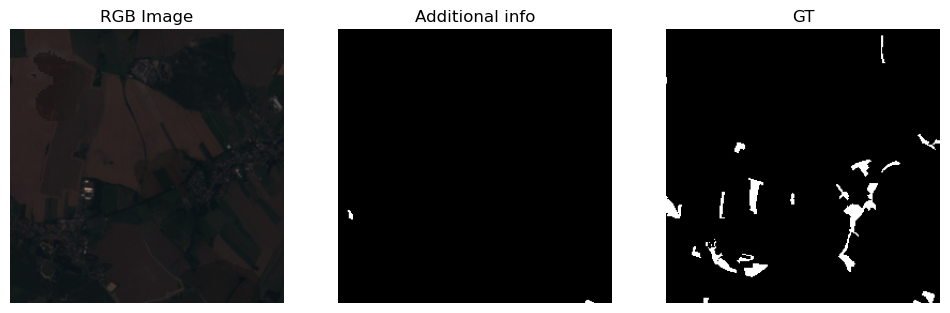

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.03


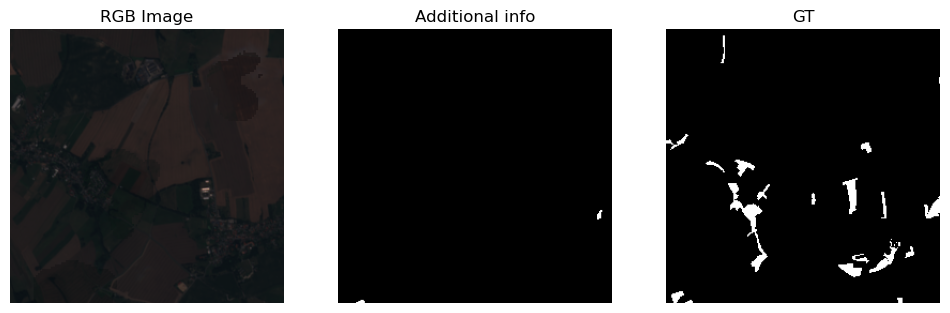

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.16


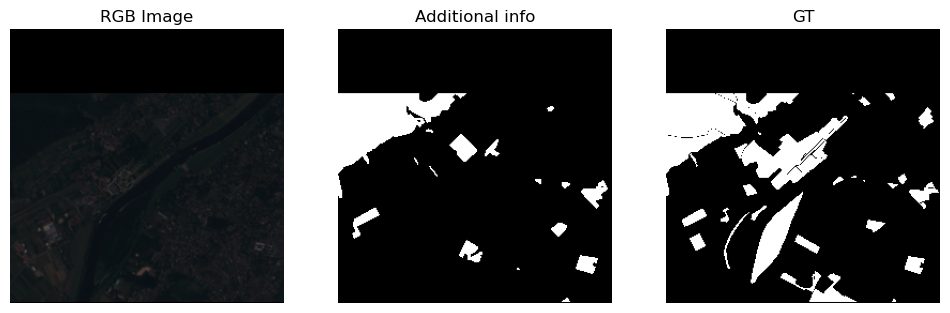

Sample 3:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.30


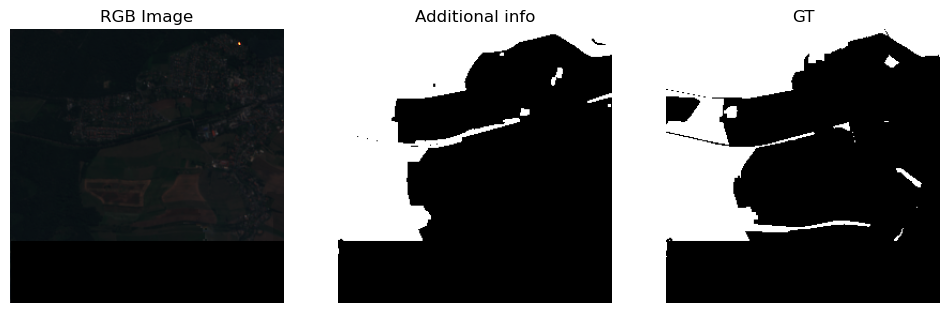

Sample 4:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.64


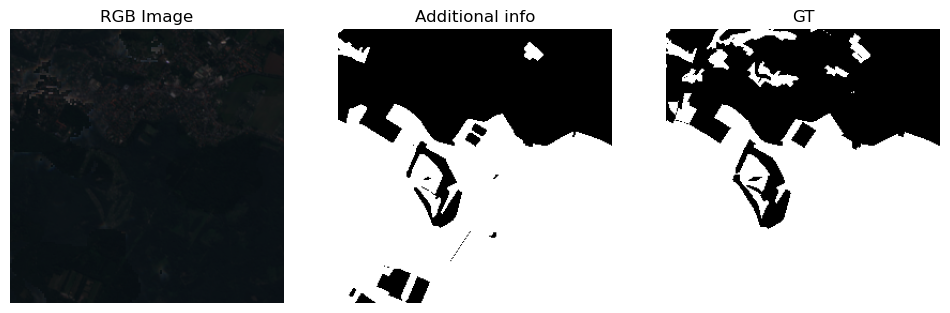

In [19]:
visualize_from_torchgeo_dataloader(train_loader, 5, 'additional', [13])
# visualize_from_torchgeo_dataloader(train_loader, 5, 'original')

## Validation dataset

Set transform_sequence to None by default or optional params

In [20]:
val_dataset = create_dataset_split(val_image_path, label_path, 32633, band_list, 'validation', None)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Using all 24 patches for validation set


In [21]:
val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples,
    num_workers=2
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.11


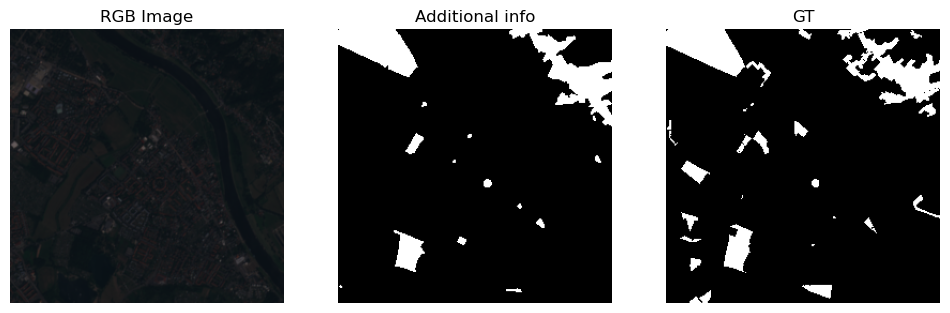

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.18


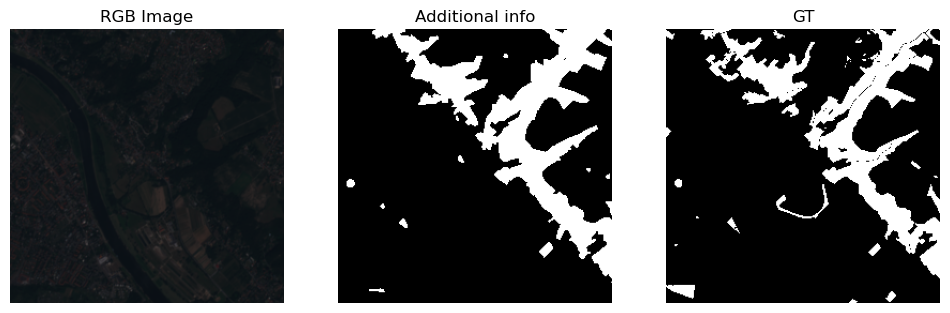

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.20


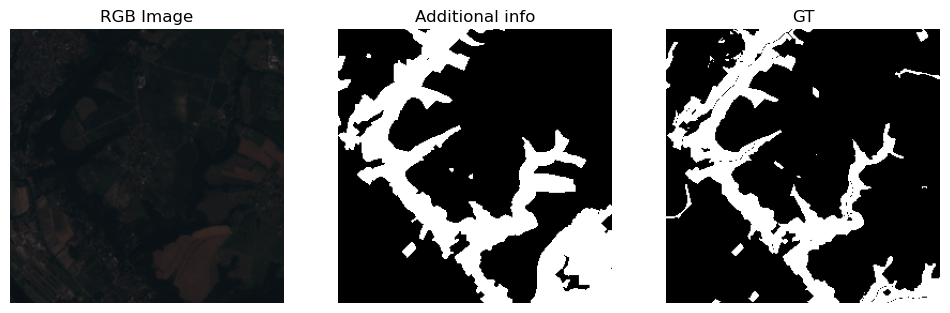

In [22]:
visualize_from_torchgeo_dataloader(val_loader, 3, 'additional', [13])
# visualize_from_torchgeo_dataloader(val_loader, 3, 'original')

## Test dataset

Set transform_sequence to None by default or optional params

In [23]:
test_dataset = create_dataset_split(test_image_path, label_path, 32633, band_list, 'test', None)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Using all 24 patches for test set


In [24]:
test_loader = DataLoader(
    test_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples,
    num_workers=1
)

In [25]:
len(test_loader)

2

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.39


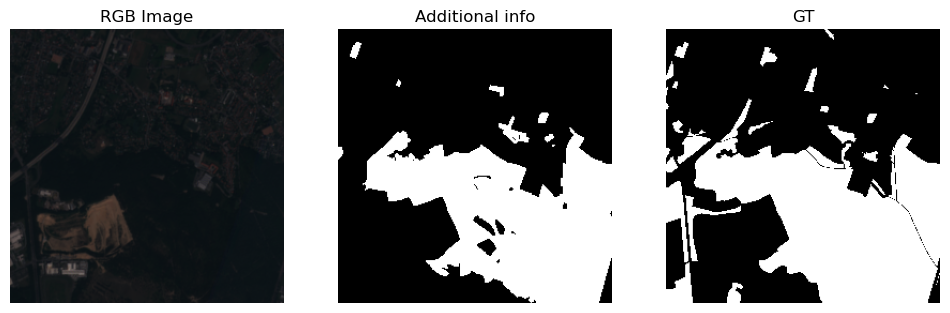

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.49


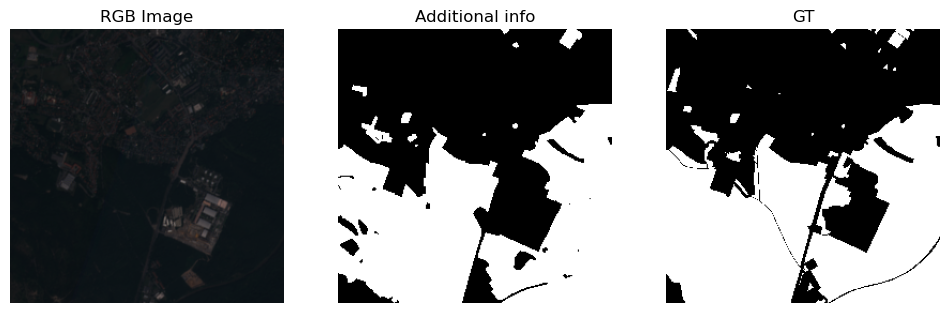

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.71


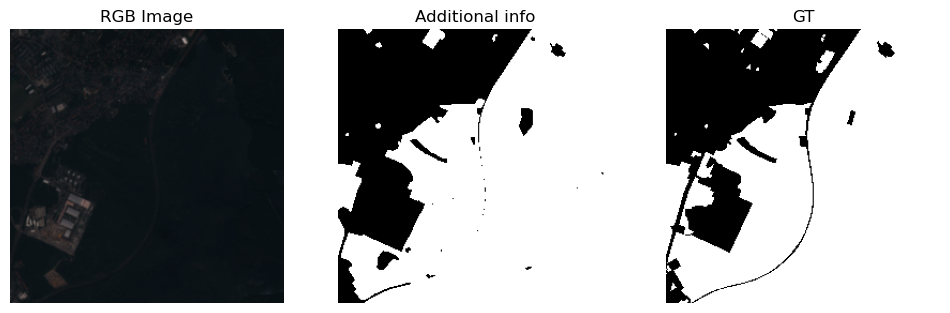

In [26]:
visualize_from_torchgeo_dataloader(test_loader, 3, 'additional', [13])
# visualize_from_torchgeo_dataloader(test_loader, 3, 'original')

# Create and train model

In [27]:
# batch_size = 10
# num_workers = 2
# max_epochs = 10
# fast_dev_run = False

In [28]:
weight_test = ResNet50_Weights.SENTINEL2_ALL_MOCO
# weight_test = ResNet50_Weights.SENTINEL2_MI_MS_SATLAS

In [29]:
from typing import Any

import kornia.augmentation as K
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import torch.nn as nn
from matplotlib.figure import Figure
from torch import Tensor
from torchmetrics import MetricCollection
from torchmetrics import Accuracy, JaccardIndex, MetricCollection
from torchvision.models._api import WeightsEnum


class CustomSegmentationTask(SemanticSegmentationTask):
    def __init__(self,**kwargs):
        # Remove 'ignore' parameter if it exists in kwargs
        if 'ignore' in kwargs:
            del kwargs['ignore']
        super().__init__(**kwargs)

    def configure_losses(self) -> None:
        """Initialize the loss criterion."""
        ignore_index: int | None = self.hparams['ignore_index']
        match self.hparams['loss']:
            case 'ce':
                ignore_value = -1000 if ignore_index is None else ignore_index
                self.criterion: nn.Module = nn.CrossEntropyLoss(
                    ignore_index=ignore_value, weight=self.hparams['class_weights']
                )
            case 'bce':
                self.criterion = nn.BCEWithLogitsLoss()
            case 'jaccard':
                # JaccardLoss requires a list of classes to use instead of a class
                # index to ignore.
                classes = [
                    i for i in range(self.hparams['num_classes']) if i != ignore_index
                ]

                self.criterion = smp.losses.JaccardLoss(
                    mode='binary'
                )
            case 'focal':
                self.criterion = smp.losses.FocalLoss(
                    'binary', ignore_index=ignore_index, normalized=True
                )
    def configure_metrics(self) -> None:
        """Initialize the performance metrics.

        * :class:`~torchmetrics.Accuracy`: Overall accuracy
          (OA) using 'micro' averaging. The number of true positives divided by the
          dataset size. Higher values are better.
        * :class:`~torchmetrics.JaccardIndex`: Intersection
          over union (IoU). Uses 'micro' averaging. Higher valuers are better.

        .. note::
           * 'Micro' averaging suits overall performance evaluation but may not reflect
             minority class accuracy.
           * 'Macro' averaging, not used here, gives equal weight to each class, useful
             for balanced performance assessment across imbalanced classes.
        """
        kwargs = {
            'task': 'binary',
            'num_classes': self.hparams['num_classes'],
            'num_labels': None,
            'ignore_index': self.hparams['ignore_index'],
        }
        metrics = MetricCollection(
            [
                Accuracy(multidim_average='global', average='micro', **kwargs),
                JaccardIndex(average='micro', **kwargs),
            ]
        )
        self.train_metrics = metrics.clone(prefix='train_')
        self.val_metrics = metrics.clone(prefix='val_')
        self.test_metrics = metrics.clone(prefix='test_')

    def training_step(
        self, batch: Any, batch_idx: int, dataloader_idx: int = 0
    ) -> Tensor:
        """Compute the training loss and additional metrics.

        Args:
            batch: The output of your DataLoader.
            batch_idx: Integer displaying index of this batch.
            dataloader_idx: Index of the current dataloader.

        Returns:
            The loss tensor.
        """
        x = batch['image']
        y = batch['mask']
        batch_size = x.shape[0]
        y_hat = self(x).squeeze(1)
        self.train_metrics(y_hat, y)
        self.log_dict(self.train_metrics, batch_size=batch_size)

        if self.hparams['loss'] == 'bce':
            y = y.float()

        loss: Tensor = self.criterion(y_hat, y)
        self.log('train_loss', loss, batch_size=batch_size)

        return loss
    
    def validation_step(
        self, batch: Any, batch_idx: int, dataloader_idx: int = 0
    ) -> None:
        """Compute the validation loss and additional metrics.

        Args:
            batch: The output of your DataLoader.
            batch_idx: Integer displaying index of this batch.
            dataloader_idx: Index of the current dataloader.
        """
        x = batch['image']
        y = batch['mask']
        batch_size = x.shape[0]
        y_hat = self(x).squeeze(1)
        self.val_metrics(y_hat, y)
        self.log_dict(self.val_metrics, batch_size=batch_size)

        if self.hparams['loss'] == 'bce':
            y = y.float()

        loss = self.criterion(y_hat, y)
        self.log('val_loss', loss, batch_size=batch_size)
    
    def test_step(self, batch: Any, batch_idx: int, dataloader_idx: int = 0) -> None:
        """Compute the test loss and additional metrics.

        Args:
            batch: The output of your DataLoader.
            batch_idx: Integer displaying index of this batch.
            dataloader_idx: Index of the current dataloader.
        """
        x = batch['image']
        y = batch['mask']
        batch_size = x.shape[0]
        y_hat = self(x).squeeze(1)
        self.test_metrics(y_hat, y)
        self.log_dict(self.test_metrics, batch_size=batch_size)

        if self.hparams['loss'] == 'bce':
            y = y.float()

        loss = self.criterion(y_hat, y)
        self.log('test_loss', loss, batch_size=batch_size)

## Modified model

13 channels + OSM binary mask

In [38]:
# Use the custom task
# task = SemanticSegmentationTask(
#     weights=weight_test,
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     num_classes=2,
#     in_channels=13,
#     lr=0.01,
#     patience=5,
# )

# task = modify_first_layer(task, in_channels=14)


# task = SemanticSegmentationTask(
#     loss='focal',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.0001,
#     patience=5,
# )

task = CustomSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone='resnet50',
    weights=weight_test,
    in_channels=13,
    num_classes=1,
    lr=0.0001,
    patience=5,
)

task = modify_first_layer(task, in_channels=14)

CustomSegmentationTask(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(14, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (re

## Original model

In [31]:
# task = SemanticSegmentationTask(
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.01,
#     patience=5,
# )

# task = SemanticSegmentationTask(
#     loss='jaccard',
#     model='unet',
#     backbone="resnet50",
#     weights=weight_test,
#     in_channels=13,
#     num_classes=2,
#     lr=0.001,
#     patience=5,
# )

task = CustomSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone='resnet50',
    weights=weight_test,
    in_channels=13,
    num_classes=1,
    lr=0.0001,
    patience=5,
)

## Training

In [39]:
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.callbacks import TQDMProgressBar

checkpoint_callback = ModelCheckpoint(
    filename='{epoch:02d}-{val_loss:.2f}',
    monitor='val_loss',
    save_top_k=3  # Save chckpoint with the best validation loss
    # every_n_epochs=5  # Save checkpoint every n epochs
)

In [40]:
from lightning.pytorch.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', patience=10)

In [41]:
from lightning.pytorch.loggers import CSVLogger

logger = CSVLogger("lightning_logs", name="pugs_detection")

In [42]:
trainer = Trainer(
    max_epochs=30, 
    deterministic=True, 
    accelerator='cpu',
    log_every_n_steps=1,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [43]:
from tqdm import tqdm

In [44]:
trainer.fit(model=task, train_dataloaders=train_loader, val_dataloaders=val_loader)

INFO: 
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.6 M | train
1 | criterion     | JaccardLoss      | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.6 M    Trainable params
0         Non-trainable params
32.6 M    Total params
130.222   Total estimated model params size (MB)
233       Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.6 M | train
1 | criterion     | JaccardLoss      | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollec

Epoch 29: 100%|██████████| 27/27 [02:39<00:00,  0.17it/s, v_num=9]         

INFO: `Trainer.fit` stopped: `max_epochs=30` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


Epoch 29: 100%|██████████| 27/27 [02:39<00:00,  0.17it/s, v_num=9]


In [45]:
trainer.test(model=task, dataloaders=test_loader)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
   test_BinaryAccuracy      0.9596036076545715
 test_BinaryJaccardIndex    0.8024278879165649
        test_loss           0.3599497377872467
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_BinaryAccuracy': 0.9596036076545715,
  'test_BinaryJaccardIndex': 0.8024278879165649,
  'test_loss': 0.3599497377872467}]

In [46]:
import numpy as np

def enhance_satellite_rgb(img):
    """
    Enhance RGB visualization of satellite imagery.
    
    Parameters:
    -----------
    img : numpy array
        Multi-band satellite image with shape [bands, height, width]
    
    Returns:
    --------
    rgb : numpy array
        Enhanced RGB image with values from 0-1, shape [height, width, 3]
    """
    # Extract RGB bands (Sentinel-2 convention: R=band 4, G=band 3, B=band 2)
    if img.shape[0] >= 13:
        r = img[3].copy()
        g = img[2].copy()
        b = img[1].copy()
    else:
        r = img[2].copy()
        g = img[1].copy()
        b = img[0].copy()
    
    rgb_list = [r, g, b]
    valid_mask = (r > 0) & (g > 0) & (b > 0)
    # Process each band individually
    for i in range(3):
        band = rgb_list[i]
        # Only consider valid pixels for percentile calculation
        if np.sum(valid_mask) > 0:  # Check if we have valid pixels
            valid_pixels = band[valid_mask]
            lower, upper = np.percentile(valid_pixels, (2, 98))
        else:
            # Fallback if no valid pixels found
            lower, upper = np.percentile(band, (2, 98))
        
        # Apply contrast stretch
        rgb_list[i] = np.clip((band - lower) / (upper - lower), 0, 1)
        
    # Stack bands into RGB
    rgb = np.stack(rgb_list, axis=2)
    
    return rgb

In [47]:
def visualize_predictions_test(model, test_loader, num_batches=5, samples_per_batch=4, mode='original', replace_band_pos=None):
    # Set model to evaluation mode
    model.eval()
    
    # Iterate through batches
    for batch_idx, batch in enumerate(test_loader):
        if batch_idx >= num_batches:
            break
        
        # Get data
        images = batch["image"]
        masks = batch["mask"]
        
       # Generate predictions
        with torch.no_grad():
            # logits = model.model.predict(images)
            logits = model(images)
            # Ensure predictions have the right shape
            preds = torch.sigmoid(logits)
            preds = (preds > 0.5).float()
            
            # Print shapes for debugging
            print(f"Prediction shape: {preds.shape}")
            print(f"Mask shape: {masks.shape}")
        
        # Create visualization
        num_samples = min(samples_per_batch, images.shape[0])
        if mode != 'original':
            num_plots = 3 + len(replace_band_pos)
        else:
            num_plots = 3
        
        fig, axes = plt.subplots(num_samples, num_plots, figsize=(15, 5*num_samples))

        if num_samples == 1:
            axes = axes.reshape(1, 3)
        
        for i in range(num_samples):
            # Get sample
            img = images[i].cpu().numpy()
            mask = masks[i].cpu().numpy()
            pred = preds[i].cpu().numpy()
            
            print(f"Sample {i} - Image shape: {img.shape}, Mask shape: {mask.shape}, Pred shape: {pred.shape}")

            # Create RGB visualization for the image
            # if img.shape[0] >= 13:
            #     # Sentinel-2 RGB composite
            #     rgb = np.stack([img[3], img[2], img[1]], axis=0)
            # else:
            #     # Sentinel-2 RGB composite
            #     rgb = np.stack([img[2], img[1], img[0]], axis=0)
            # rgb = np.transpose(rgb, (1, 2, 0))

            rgb = enhance_satellite_rgb(img)
            # Ensure mask is 2D for plotting
            if mask.ndim > 2:
                if mask.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    mask = mask.squeeze(0)
                else:
                    # Multiple channels, take the first one
                    mask = mask[0]
            
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
                    print(np.max(pred))
            
            additional_info_pos = 0
            # Plot
            for j in range(num_plots):
                if j==0:
                    print(np.percentile(rgb, 2), np.percentile(rgb, 98))
                    axes[i, j].imshow(rgb)
                    axes[i, j].set_title("Image")
                    axes[i, j].axis("off")
                elif j==1:
                    axes[i, j].imshow(mask, cmap="gray")
                    axes[i, j].set_title("Ground Truth")
                    axes[i, j].axis("off")
                elif j==(num_plots-1):
                    try:
                        axes[i, j].imshow(pred, cmap="gray")
                        axes[i, j].set_title("Prediction")
                        axes[i, j].axis("off")
                    except Exception as e:
                        print(f"Error plotting prediction: {e}")
                        print(f"Prediction shape: {pred.shape}, dtype: {pred.dtype}")
                        # Try alternate approach
                        if pred.ndim > 2:
                            pred_2d = pred.mean(axis=0)  # Average across channels
                            axes[i, j].imshow(pred_2d, cmap="gray")
                        else:
                            # Create a blank image
                            blank = np.zeros_like(mask)
                            axes[i, j].imshow(blank, cmap="gray")
                        axes[i, j].set_title("Prediction (Error)")
                        axes[i, j].axis("off")
                else:
                    axes[i, j].imshow(img[replace_band_pos[additional_info_pos]], cmap="gray")
                    axes[i, j].set_title("Additional Info")
                    axes[i, j].axis("off")
                    additional_info_pos += 1

        plt.tight_layout()
        plt.show()

Prediction shape: torch.Size([16, 1, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 0.7983424067497253


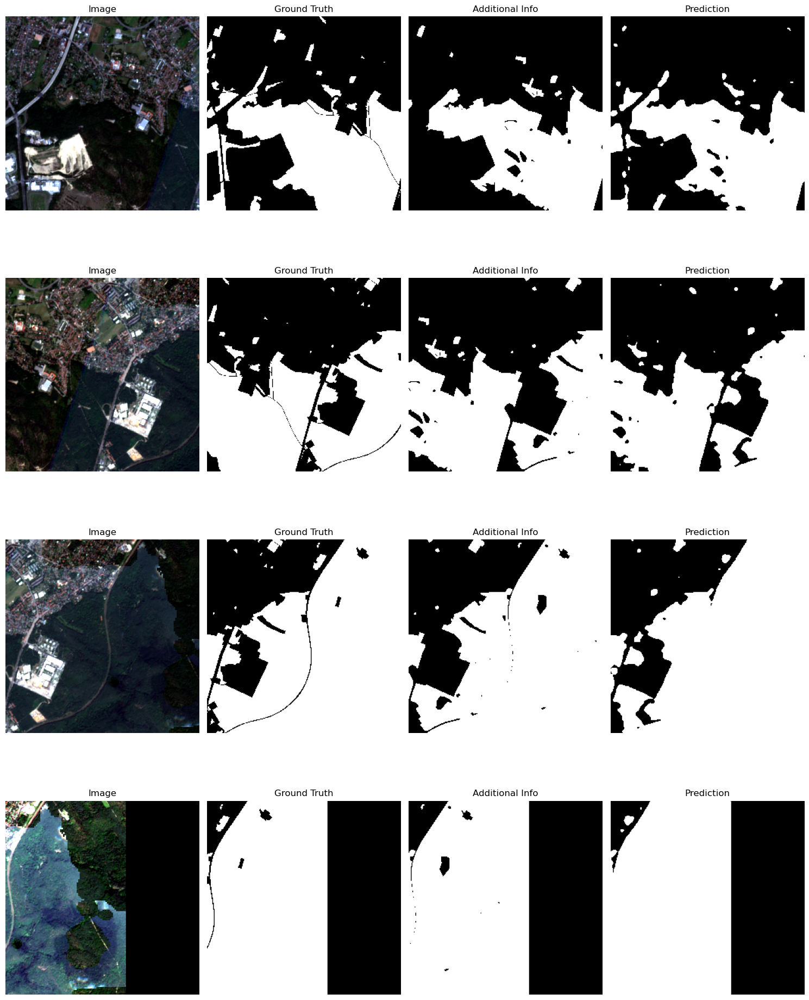

Prediction shape: torch.Size([8, 1, 256, 256])
Mask shape: torch.Size([8, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 0.9999426138400974
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 0.9995395541191101
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
0.0 0.8388746380805969


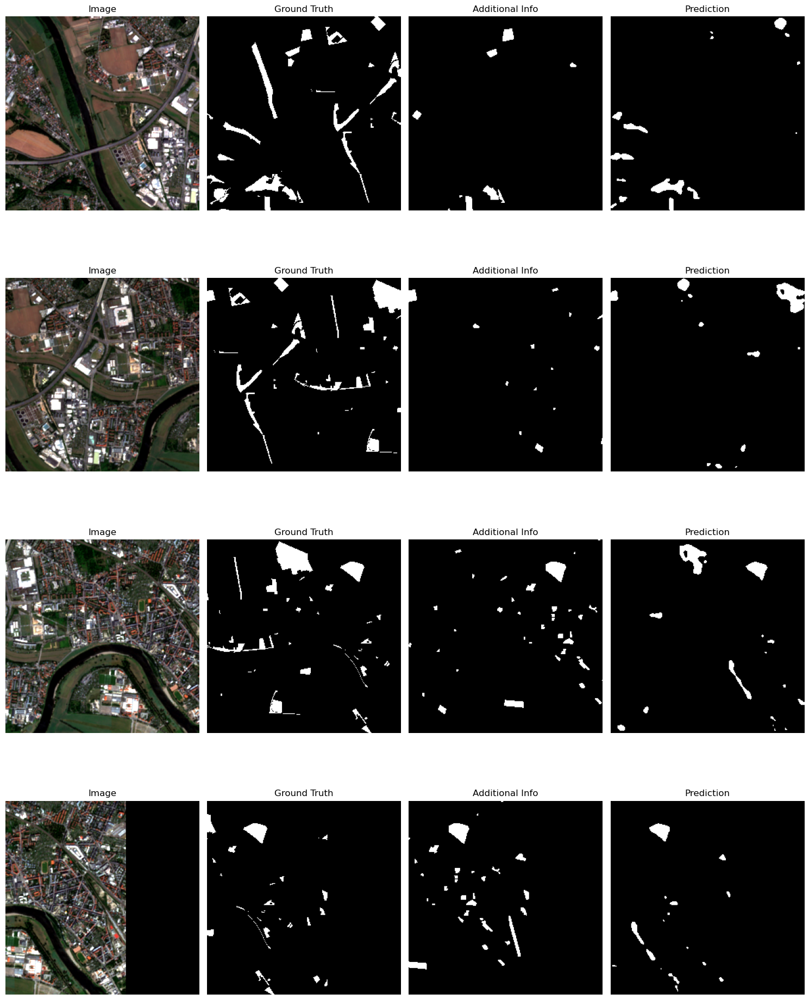

In [48]:
visualize_predictions_test(task, test_loader, mode='additional', replace_band_pos=[13])
# visualize_predictions_test(task, test_loader, mode='original')

Prediction shape: torch.Size([16, 1, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)


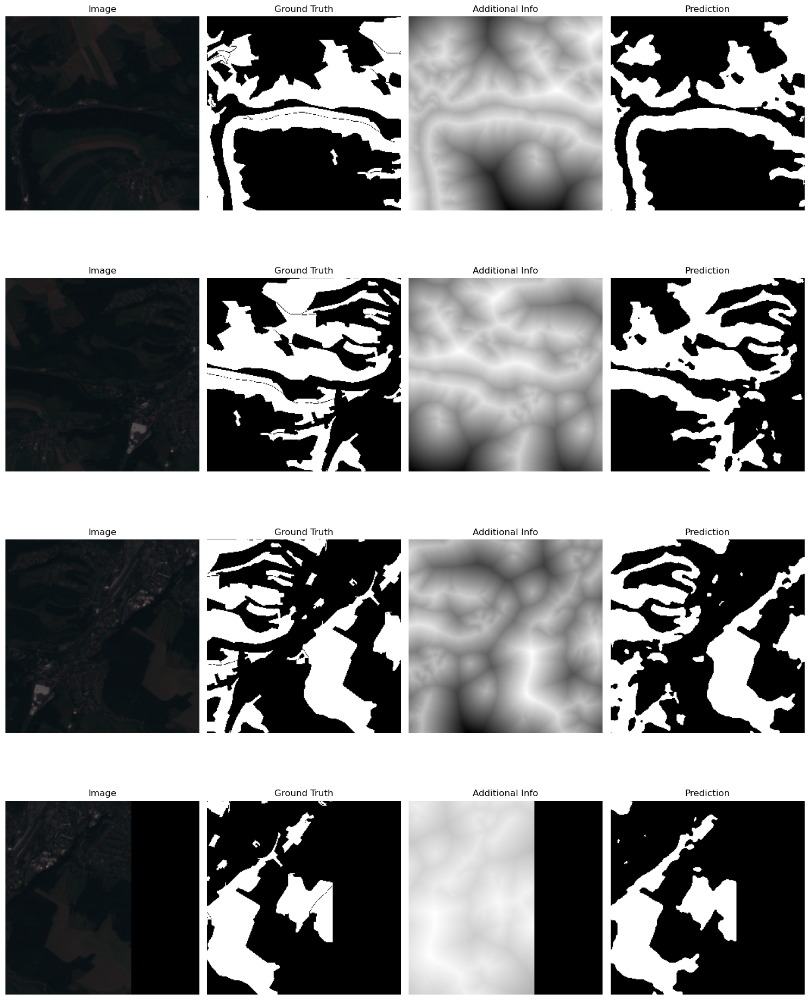

Prediction shape: torch.Size([16, 1, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)


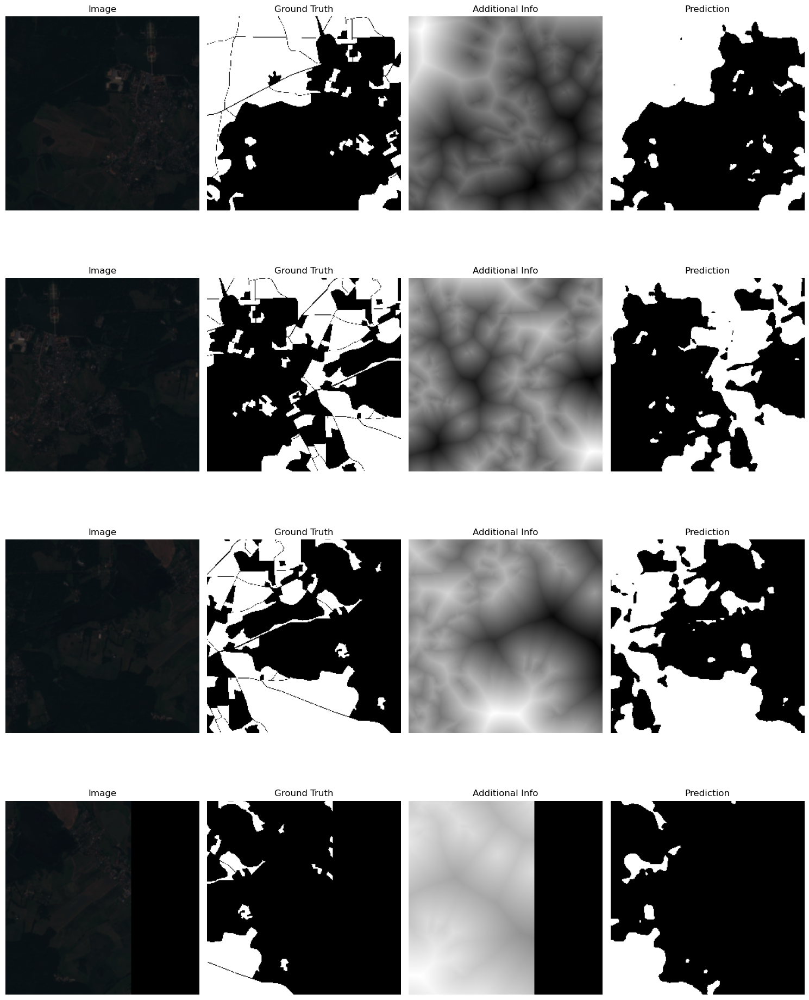

Prediction shape: torch.Size([16, 1, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)


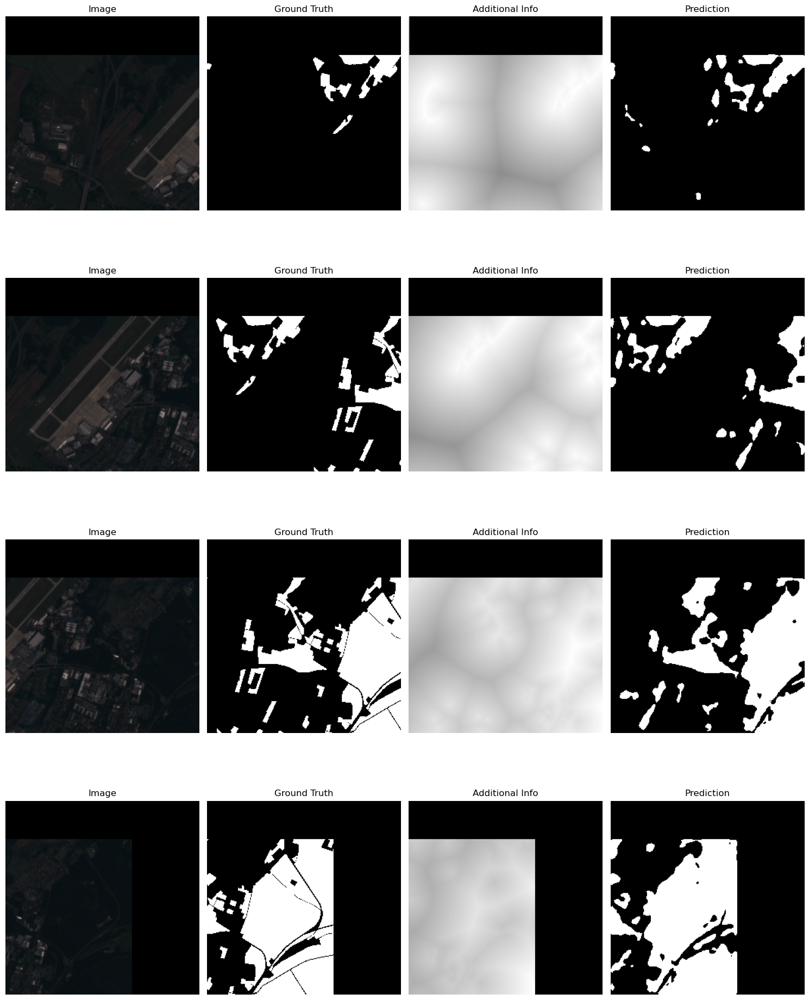

Prediction shape: torch.Size([12, 1, 256, 256])
Mask shape: torch.Size([12, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (1, 256, 256)


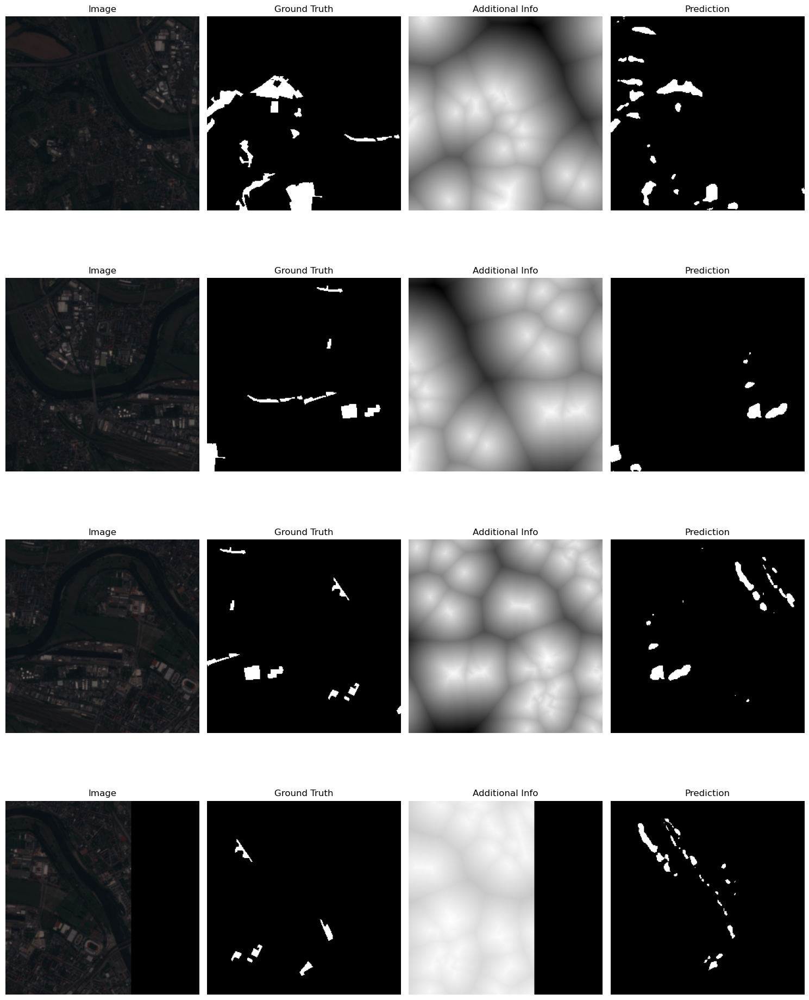

In [40]:
visualize_predictions(task, test_loader, mode='additional', replace_band_pos=[13])
# visualize_predictions(task, test_loader, mode='original')

# Load model from checkpoint

In [68]:
# Path to your checkpoint file
checkpoint_path = "../notebooks/lightning_logs/pugs_detection/version_9/checkpoints/epoch=28-val_loss=0.44.ckpt"

# Direct loading with the correct channel count
model = CustomSegmentationTask.load_from_checkpoint(
    checkpoint_path,
    in_channels=14  # Match what's in the checkpoint
)

In [69]:
# trainer.test(model=model, dataloaders=test_loader)

# Confusion matrix

In [70]:
def generate_confusion_matrix(model, test_loader):
    from sklearn.metrics import confusion_matrix
    import numpy as np
    import torch
    
    # Set model to evaluation mode
    model.eval()
    
    # Collect all predictions and ground truths
    all_preds = []
    all_masks = []
    
    with torch.no_grad():
        for batch in test_loader:
            images = batch["image"]
            masks = batch["mask"]
            
            # Generate predictions
            logits = model(images)
            preds = torch.sigmoid(logits)
            preds_binary = (preds > 0.5).int()
            
            # Add to collection (flatten everything)
            all_preds.extend(preds_binary.cpu().numpy().flatten())
            all_masks.extend(masks.cpu().numpy().flatten())
    
    # Calculate confusion matrix
    cm = confusion_matrix(all_masks, all_preds)
    
    # Visualization
    import matplotlib.pyplot as plt
    import seaborn as sns
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='.0f', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    
    return cm

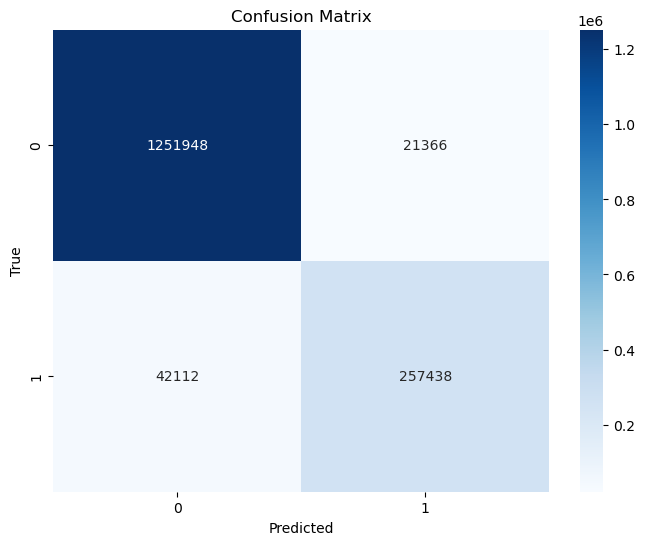

True Negative: 1251948
False Positive: 21366
False Negative: 42112
True Positive: 257438


In [71]:
cm = generate_confusion_matrix(model, test_loader)
print("True Negative:", cm[0,0])
print("False Positive:", cm[0,1])
print("False Negative:", cm[1,0])
print("True Positive:", cm[1,1])

In [72]:
precision = cm[1,1] / (cm[1,1] + cm[0,1])
recall = cm[1,1] / (cm[1,1] + cm[1,0])
f1 = 2 * precision * recall / (precision + recall)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Accuracy: {np.sum(np.diag(cm)) / np.sum(cm):.4f}")
print(f"IoU: {cm[1,1] / (cm[1,1] + cm[0,1] + cm[1,0]):.4f}")

Precision: 0.9234
Recall: 0.8594
F1 Score: 0.8902
Accuracy: 0.9596
IoU: 0.8022


# Test plot

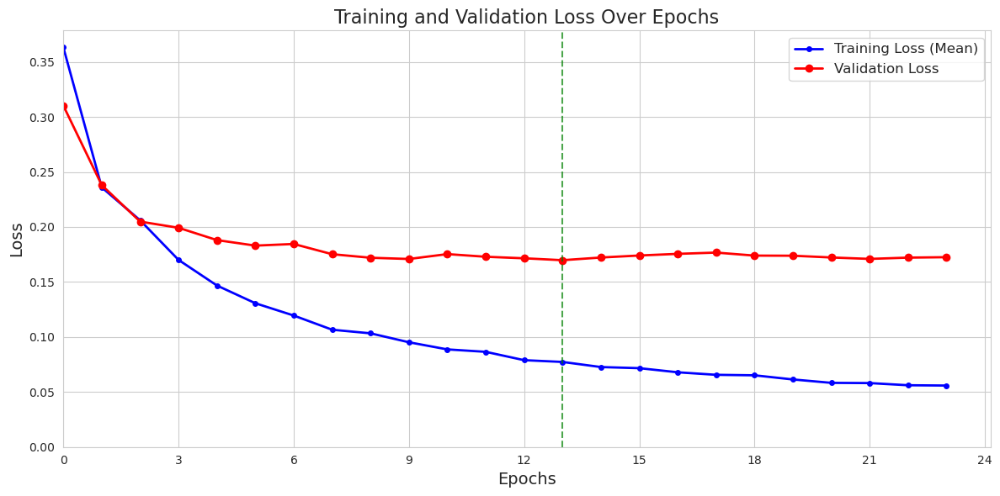

Best model at epoch 13:
  Val Loss: 0.1698
  Val Jaccard: 0.7911


In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

# Read the metrics CSV file
metrics_path = '../notebooks/lightning_logs/pugs_detection/version_7/metrics.csv'
df = pd.read_csv(metrics_path)

# Create a figure with appropriate size
plt.figure(figsize=(12, 6))
sns.set_style('whitegrid')

# Plot mean training loss per epoch
train_df = df.groupby('epoch')['train_loss'].mean().reset_index()
plt.plot(train_df['epoch'], train_df['train_loss'], 'b-', marker='o', markersize=4, linewidth=2, label='Training Loss (Mean)')

# Plot validation loss - filter rows where val_loss exists
val_df = df[df['val_loss'].notna()].copy()
plt.plot(val_df['epoch'], val_df['val_loss'], 'r-', marker='o', markersize=6, linewidth=2, label='Validation Loss')

# Add labels and title
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss Over Epochs', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)

# Adjust axis for better visualization
plt.xlim(left=0)
plt.ylim(bottom=0)

# Set x-axis to integer ticks only
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

# Add vertical line at best validation performance
best_epoch = val_df.loc[val_df['val_loss'].idxmin()]['epoch']
plt.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.7, 
            label=f'Best model (epoch {int(best_epoch)})')

plt.tight_layout()
plt.show()

# Print best epoch stats
best_row = val_df[val_df['epoch'] == best_epoch].iloc[0]
print(f"Best model at epoch {int(best_epoch)}:")
print(f"  Val Loss: {best_row['val_loss']:.4f}")
print(f"  Val Jaccard: {best_row['val_BinaryJaccardIndex']:.4f}")

# Test predict whole area

In [74]:
image_path_whole_area = '../data/processed/sentinel-2/stacked_sentinel2_dresden.geotiff'

In [82]:
# Use custom collate function to maintain window_ifo as list of tuples
# so we can easily extract the window coordinates
def custom_collate_fn(batch):
    """Keep window coordinates as a list of tuples instead of tensors"""
    images = torch.stack([torch.from_numpy(item["image"]) for item in batch])
    window_infos = [item["window_info"] for item in batch]
    
    return {
        "image": images,
        "window_info": window_infos
    }

In [83]:
# band_list_predict = [0,1,2,3,4,5,6,7,8,9,10,11,12,13] # 13 is osm binary mask
# band_list_predict = [0,1,2,3,4,5,6,7,8,9,10,11,12] # 13 is osm binary mask
band_list_predict = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]

In [84]:
file_output_path = '../reports/prediction_results_track/whole_area_prediction/5_new_data_augmentation/test.tif'

In [85]:
import torch
import numpy as np
import rasterio
from torch.utils.data import Dataset, DataLoader
from rasterio.windows import Window
from tqdm.auto import tqdm

class LargeImageDataset(Dataset):
    def __init__(self, image_path, patch_size=256, stride=256):
        self.image_path = image_path
        self.patch_size = patch_size
        self.stride = stride
        
        # Open the image to get dimensions
        with rasterio.open(image_path) as src:
            self.height = src.height
            self.width = src.width
            self.count = src.count
            self.transform = src.transform
            self.crs = src.crs

        # Create list of windows - all using Window objects
        self.windows = []
        for y in range(0, self.height - patch_size + 1, stride):
            for x in range(0, self.width - patch_size + 1, stride):
                self.windows.append(Window(x, y, patch_size, patch_size))

        # Edge patches along bottom
        if self.height % stride != 0:
            last_y = self.height - patch_size
            for x in range(0, self.width - patch_size + 1, stride):
                self.windows.append(Window(x, last_y, patch_size, patch_size))

        # Edge patches along right side
        if self.width % stride != 0:
            last_x = self.width - patch_size
            for y in range(0, self.height - patch_size + 1, stride):
                self.windows.append(Window(last_x, y, patch_size, patch_size))

        # Corner patch (if needed)
        if self.width % stride != 0 and self.height % stride != 0:
            self.windows.append(Window(self.width - patch_size, 
                                    self.height - patch_size,
                                    patch_size, patch_size))
               
    def __len__(self):
        return len(self.windows)
    
    def __getitem__(self, idx):
        window = self.windows[idx]
        
        with rasterio.open(self.image_path) as src:
            # Read image data for this window
            image = src.read(window=window)
            # image = image[0:14, :, :]  # Select specific bands
            image = image[band_list_predict] # Select specific bands
            
        return {
            "image": image,
            "window_info": window  # Store coordinates as tuple
        }

# Regular DataLoader without custom collate function
inference_dataset = LargeImageDataset(image_path_whole_area, patch_size=256, stride=256)
# Regular DataLoader WITH custom collate function
inference_loader = DataLoader(
    inference_dataset, 
    batch_size=4, 
    num_workers=4,
    collate_fn=custom_collate_fn  # Use our custom collate
)
# Create output array
prediction_map = np.zeros((inference_dataset.height, inference_dataset.width), dtype=np.float32)
counts = np.zeros((inference_dataset.height, inference_dataset.width), dtype=np.float32)

# Process all patches
task.model.eval()
with torch.no_grad():
    for batch in tqdm(inference_loader):
        # Get images and window info
        images = batch["image"]
        windows = batch["window_info"]
        
        # Run inference
        outputs = task.model(images)
        probs = torch.sigmoid(outputs)
        preds = (probs > 0.5).float()
        
        # Process each patch in the batch
        # Process each patch in the batch
        for i, window in enumerate(windows):
            # Get window coordinates
            x_off = window.col_off
            y_off = window.row_off
            width = window.width
            height = window.height
            
            # Get prediction for this patch
            pred = preds[i].squeeze().cpu().numpy()
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
            # Add to output array
            prediction_map[y_off:y_off+height, x_off:x_off+width] += pred
            counts[y_off:y_off+height, x_off:x_off+width] += 1

# Average overlapping predictions
with np.errstate(divide='ignore', invalid='ignore'):
    prediction_map = np.divide(prediction_map, counts)
    prediction_map = np.nan_to_num(prediction_map)

# Save the prediction
with rasterio.open(
    file_output_path, 
    'w',
    driver='GTiff',
    height=inference_dataset.height,
    width=inference_dataset.width,
    count=1,
    dtype=rasterio.float32,
    crs=inference_dataset.crs,
    transform=inference_dataset.transform
) as dst:
    dst.write(prediction_map[np.newaxis, :, :])

100%|██████████| 25/25 [00:08<00:00,  3.08it/s]


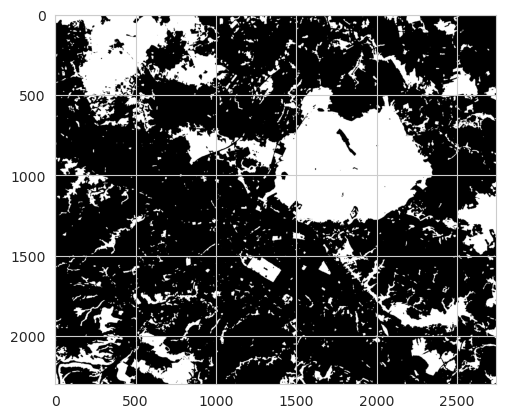

In [86]:
# image_path = 'pugs_prediction_osm_additional_v26.tif'

open_image = rasterio.open(file_output_path)
image = open_image.read(1)
plt.imshow(image, cmap='gray')
open_image.close()

need to fix! the result give 0, 0.5, and 1 value (shouldn't be 0.5)

In [ ]:
image.max()

1.0